Group 8 
group member: 
Yu Chin Chen
Balbir Singh
Maria Sequei
Rasika Teli
Harsh Kevadiya

In [ ]:
🔹Business Problem: Within the shopping category, we want to identify which business type has received the most positive reviews and which has received the most negative reviews, as well as explore the reasons behind these ratings. The goal is to provide insights and recommendations to better understand consumer preferences and meet their needs.


In [4]:
!pip install pandas

In [5]:
!pip install matplotlib

In [6]:
!pip install s3fs==2023.9.2

  Using cached s3fs-2023.9.2-py3-none-any.whl.metadata (1.6 kB)
  Using cached aiobotocore-2.5.4-py3-none-any.whl.metadata (19 kB)
  Using cached fsspec-2023.9.2-py3-none-any.whl.metadata (6.7 kB)
  Using cached botocore-1.31.17-py3-none-any.whl.metadata (5.9 kB)
Using cached s3fs-2023.9.2-py3-none-any.whl (28 kB)
Using cached fsspec-2023.9.2-py3-none-any.whl (173 kB)
Using cached aiobotocore-2.5.4-py3-none-any.whl (73 kB)
Using cached botocore-1.31.17-py3-none-any.whl (11.1 MB)
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2023.6.0
    Uninstalling fsspec-2023.6.0:
      Successfully uninstalled fsspec-2023.6.0
  Attempting uninstall: botocore
    Found existing installation: botocore 1.34.162
    Uninstalling botocore-1.34.162:
      Successfully uninstalled botocore-1.34.162
  Attempting uninstall: aiobotocore
    Found existing installation: aiobotocore 2.13.3
    Uninstalling aiobotocore-2.13.3:
      Successfully uninstalled aiobotocore-2.13.3
ERROR: pip'

In [5]:
#import nesscery liabraries
import pandas as pd 
import s3fs
import gc 
import matplotlib.pyplot as plt

🔹Data Preparation 

In [6]:
# File paths for each dataset
s3_bucket_path = 's3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/'
business_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/business_output-- only shopping.csv' #S3 location of business.json
review_file_path ='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/yelp_academic_dataset_review.json'#S3 location of review.json
user_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/yelp_academic_dataset_user.json'  # S3 location of user.json
checkin_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/yelp_academic_dataset_checkin.json' #S3 location of checkin.json
tip_file_path='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/yelp_academic_dataset_tip.json' #S3 location of tip.json

In [7]:
#Read Bussiness file 
#The business file we are using here is the one where we have already filtered out all the shopping-related columns in Excel.
business_file = pd.read_csv(business_file_path, encoding="ISO-8859-1")
print(business_file.head())

              business_id                        name  \
0  qhDdDeI3K4jy2KyzwFN53w  Barnes & Noble Booksellers   
1  B2qqjCl_BNNnXvWWfpFiLA           Pottery Barn Kids   
2  I6DCYks9lqZeoZiVzW7PmA               Its Sold Here   
3  XHTgtBSwLnwRHzKSbea2Fg                Michael Kors   
4  U2htB9qk4hOXCdkccvvW0Q                    D's Toys   

                          address          city state postal_code   latitude  \
0        8675 River Crossing Blvd  Indianapolis    IN       46240  39.913820   
1    4011 Hillsboro Pike, Ste 102     Nashville    TN       37215  36.103614   
2                      94 York Rd  Willow Grove    PA       19090  40.142849   
3  8701 Keystone Crossing, Ste 28  Indianapolis    IN       46240  39.914404   
4            2616 Brill Rd, Ste A  Indianapolis    IN       46225  39.729158   

   longitude  stars  review_count  is_open  \
0 -86.105739    4.0            38        1   
1 -86.816268    1.5            13        1   
2 -75.114379    1.5            10     

In [8]:
#Read review file 
review_df = pd.read_json(review_file_path, lines=True)

Processing and Cleaning

In [9]:
# Check for missing values
missing_values_review = review_df.isnull().sum()
missing_values_business = business_file.isnull().sum()

# Check for duplicate rows
duplicate_review = review_df.duplicated().sum()
duplicate_business = business_file.duplicated().sum()

# Display results
print("Missing Values in Review Dataset:\n", missing_values_review)
print("\nMissing Values in Business Dataset:\n", missing_values_business)

print(f"\nDuplicate Rows in Review Dataset: {duplicate_review}")
print(f"Duplicate Rows in Business Dataset: {duplicate_business}")

Missing Values in Review Dataset:
 review_id      0
user_id        0
business_id    0
stars          0
useful         0
funny          0
cool           0
text           0
date           0
dtype: int64

Missing Values in Business Dataset:
 business_id       0
name              0
address          14
city              0
state             0
postal_code       2
latitude          0
longitude         0
stars             0
review_count      0
is_open           0
attributes      105
categories        0
hours           456
dtype: int64

Duplicate Rows in Review Dataset: 0
Duplicate Rows in Business Dataset: 0


We found that the business file contains missing values, but since they are not in the fields we will be using, we decided to keep them.

Cluster Analysis for Bussiness file: 

Cluster Analysis of Shopping Categories:
We categorized the shopping categories within the business file:
Since the shopping column contains a wide range of categories, we further refined the classification.

In [10]:
#Since the categories are in text format, we need to use TF-IDF vectorization to convert them into numerical representations. This allows the machine learning model to understand their similarities effectively.
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Load the data using your specified encoding
business_file = pd.read_csv(business_file_path, encoding="ISO-8859-1")

# Convert categories to string (to prevent NaN issues)
business_file["categories"] = business_file["categories"].fillna("").astype(str)

# Apply TF-IDF for feature extraction
vectorizer = TfidfVectorizer(tokenizer=lambda x: x.split(", "), stop_words="english")
category_vectors = vectorizer.fit_transform(business_file["categories"])

print("TF-IDF feature matrix shape:", category_vectors.shape)

TF-IDF feature matrix shape: (2011, 296)


In [11]:
#We used K-Means clustering to group similar shopping categories based on TF-IDF representations.
from sklearn.cluster import KMeans

# Set the number of clusters (you can adjust this)
num_clusters = 5  # Try different values to find the best one

# Perform K-Means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
business_file["category_cluster"] = kmeans.fit_predict(category_vectors)

# Display the number of businesses in each cluster
print("Cluster distribution:\n", business_file["category_cluster"].value_counts())

Cluster distribution:
 category_cluster
0    1543
1     232
4      86
2      80
3      70
Name: count, dtype: int64


In [12]:
from collections import Counter

# Function to get the most common categories in each cluster
def get_top_categories(df, cluster_num, top_n=10):
    cluster_data = df[df["category_cluster"] == cluster_num]["categories"].dropna()
    all_categories = ", ".join(cluster_data).split(", ")  # Split category lists
    category_counts = Counter(all_categories)  # Count category frequency
    return category_counts.most_common(top_n)  # Return top N categories

# Print top categories for each cluster
for cluster in range(num_clusters):
    print(f"\n🔥 Top categories in Cluster {cluster}:")
    print(get_top_categories(business_file, cluster, top_n=10))


🔥 Top categories in Cluster 0:
[('Shopping', 1543), ('Fashion', 293), ('Jewelry', 157), ('Eyewear & Opticians', 135), ('Health & Medical', 134), ('Optometrists', 101), ('Drugstores', 100), ('Tobacco Shops', 99), ('Department Stores', 93), ('Shopping Centers', 82)]

🔥 Top categories in Cluster 1:
[('Shopping', 232), ('Home & Garden', 232), ('Furniture Stores', 85), ('Hardware Stores', 64), ('Nurseries & Gardening', 45), ('Mattresses', 26), ('Appliances', 24), ('Home Decor', 17), ('Kitchen & Bath', 16), ('Home Services', 13)]

🔥 Top categories in Cluster 2:
[('Shopping', 80), ('Discount Store', 80), ('Department Stores', 3), ('Fashion', 3), ('Thrift Stores', 2), ('Outlet Stores', 1)]

🔥 Top categories in Cluster 3:
[('Shopping', 70), ('Books', 70), ('Mags', 70), ('Music & Video', 70), ('Bookstores', 47), ('Music & DVDs', 10), ('Comic Books', 9), ('Hobby Shops', 4), ('Toy Stores', 2), ('Videos & Video Game Rental', 2)]

🔥 Top categories in Cluster 4:
[('Shopping', 86), ('Flowers & Gifts'

Since Cluster 2 and Cluster 0 are very similar, we merged them, resulting in four business types in the final classification.

In [13]:
# Rename Cluster 2 to Cluster 0
business_file["category_cluster"] = business_file["category_cluster"].replace(2, 0)

# Check the updated cluster distribution
print("Updated Cluster distribution:\n", business_file["category_cluster"].value_counts())


Updated Cluster distribution:
 category_cluster
0    1623
1     232
4      86
3      70
Name: count, dtype: int64


In [15]:
from collections import Counter

# Function to get the most common categories in each cluster
def get_top_categories(df, cluster_num, top_n=10):
    cluster_data = df[df["category_cluster"] == cluster_num]["categories"].dropna()
    all_categories = ", ".join(cluster_data).split(", ")  # Split category lists
    category_counts = Counter(all_categories)  # Count category frequency
    return category_counts.most_common(top_n)  # Return top N categories

# Print top categories for each cluster
for cluster in range(num_clusters):
    print(f"\n🔥 Top categories in Cluster {cluster}:")
    print(get_top_categories(business_file, cluster, top_n=10))


🔥 Top categories in Cluster 0:
[('Shopping', 1623), ('Fashion', 296), ('Jewelry', 157), ('Eyewear & Opticians', 135), ('Health & Medical', 134), ('Optometrists', 101), ('Drugstores', 100), ('Tobacco Shops', 99), ('Department Stores', 96), ('Discount Store', 85)]

🔥 Top categories in Cluster 1:
[('Shopping', 232), ('Home & Garden', 232), ('Furniture Stores', 85), ('Hardware Stores', 64), ('Nurseries & Gardening', 45), ('Mattresses', 26), ('Appliances', 24), ('Home Decor', 17), ('Kitchen & Bath', 16), ('Home Services', 13)]

🔥 Top categories in Cluster 2:
[('', 1)]

🔥 Top categories in Cluster 3:
[('Shopping', 70), ('Books', 70), ('Mags', 70), ('Music & Video', 70), ('Bookstores', 47), ('Music & DVDs', 10), ('Comic Books', 9), ('Hobby Shops', 4), ('Toy Stores', 2), ('Videos & Video Game Rental', 2)]

🔥 Top categories in Cluster 4:
[('Shopping', 86), ('Flowers & Gifts', 86), ('Florists', 86), ('Home & Garden', 5), ('Nurseries & Gardening', 4), ('Floral Designers', 2), ('Event Planning & 

In [16]:
# Define new cluster labels
cluster_labels = {
    0: "Fashion & Personal Goods Stores",
    1: "Home Improvement & Furniture Stores",
    3: "Books, Media & Hobby Shops",
    4: "Gifts, Florists & Specialty Shops"
}

# Add a new label column
business_file["cluster_label"] = business_file["category_cluster"].map(cluster_labels)

# Check the results
print(business_file[["category_cluster", "cluster_label"]].head(10))


   category_cluster                        cluster_label
0                 3           Books, Media & Hobby Shops
1                 1  Home Improvement & Furniture Stores
2                 0      Fashion & Personal Goods Stores
3                 0      Fashion & Personal Goods Stores
4                 3           Books, Media & Hobby Shops
5                 1  Home Improvement & Furniture Stores
6                 0      Fashion & Personal Goods Stores
7                 0      Fashion & Personal Goods Stores
8                 1  Home Improvement & Furniture Stores
9                 0      Fashion & Personal Goods Stores


 Review file: Retrieve business_id from business_file

In [17]:
# Retrieve business_id from business_file (already filtered for Shopping businesses)
shopping_business_ids = business_file["business_id"]

# Filter reviews, keeping only those belonging to businesses in business_file (Shopping category)
shopping_reviews = review_df[review_df["business_id"].isin(shopping_business_ids)]

# Count the total number of filtered reviews (rows)
num_reviews = shopping_reviews.shape[0]

# Count the number of unique business IDs in the filtered reviews
num_unique_businesses = shopping_reviews["business_id"].nunique()

# Save the filtered reviews to a CSV file
output_file = "filtered_shopping_reviews.csv"
shopping_reviews.to_csv(output_file, index=False)

# Print the results
print(f"Number of rows in filtered reviews (Shopping businesses): {num_reviews}")
print(f"Number of unique business IDs in filtered reviews: {num_unique_businesses}")
print(f"Filtered reviews saved to: {output_file}")


Number of rows in filtered reviews (Shopping businesses): 33259
Number of unique business IDs in filtered reviews: 2011
Filtered reviews saved to: filtered_shopping_reviews.csv


Ensure there are no missing values or duplicate entries in the review file.

In [21]:
#load filtered review file
review_file_path2 ='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/filtered_shopping_reviews.csv'
review_df2 = pd.read_csv(review_file_path2, encoding="ISO-8859-1")

# process and clean the data 
# Check for missing values in each column
missing_values = review_df2.isnull().sum()

# Count the number of fully duplicated rows
duplicate_rows = review_df2.duplicated().sum()

# Print results
print("Missing Values per Column:\n", missing_values)
print(f"\nNumber of Fully Duplicate Rows: {duplicate_rows}")

Missing Values per Column:
 review_id      0
user_id        0
business_id    0
stars          0
useful         0
funny          0
cool           0
text           0
date           0
dtype: int64

Number of Fully Duplicate Rows: 0


Categorize the review file and label it based on our defined classifications.

In [22]:
# Keep only relevant columns from business file (business_id & cluster_label)
business_clusters = business_file[["business_id", "cluster_label"]]

# Merge the review file with business clusters using business_id
categorized_reviews = review_df2.merge(business_clusters, on="business_id", how="left")

# Check if all reviews got assigned a category
print("Number of reviews after categorization:", len(categorized_reviews))
print("Number of reviews per category:\n", categorized_reviews["cluster_label"].value_counts())

Number of reviews after categorization: 33259
Number of reviews per category:
 cluster_label
Fashion & Personal Goods Stores        26023
Home Improvement & Furniture Stores     4203
Gifts, Florists & Specialty Shops       1804
Books, Media & Hobby Shops              1229
Name: count, dtype: int64


In [48]:
# Define the output file name
output_file = "categorized_shopping_reviews.csv"

# Save the filtered reviews as a CSV file
categorized_reviews.to_csv(output_file, index=False)

print(f"Categorized reviews saved to: {output_file}")


Categorized reviews saved to: categorized_shopping_reviews.csv


In [51]:
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from collections import Counter
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

#✅ Downloading necessary NLP tools
nltk.download("stopwords")
nltk.download("wordnet")

#✅ Initializing stopwords & lemmatizer
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

#✅ Defining the text cleaning function
def clean_text(text):
    if isinstance(text, str):  # Ensure the text is a string
        text = text.lower()  # Convert to lowercase
        text = re.sub(r"[^\w\s]", "", text)  # Remove punctuation
        text = " ".join(lemmatizer.lemmatize(word) for word in text.split() if word not in stop_words)  # Lemmatization & stopword removal
        return text
    return ""

# Apply text cleaning
review_df3["cleaned_text"] = review_df3["text"].apply(clean_text)

# Check cleaned data
print("\n✅ Cleaned text sample:")
print(review_df3[["cluster_label", "cleaned_text"]].head())
print(" Review data is ready")

[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!



✅ Cleaned text sample:
                     cluster_label  \
0  Fashion & Personal Goods Stores   
1  Fashion & Personal Goods Stores   
2  Fashion & Personal Goods Stores   
3  Fashion & Personal Goods Stores   
4  Fashion & Personal Goods Stores   

                                        cleaned_text  
0  experience shalimar nothing wonderful wanted g...  
1  steve partner best love hell bunch demo racque...  
2  ive many art museum surprised see museum beaut...  
3  dr curtis dechant excellent chairside manner e...  
4  sometimes head kingsway need little shopping f...  
 Review data is ready


🔹EDA

In [7]:
#load filtered review file
review_catergorized_Filtered ='s3://amazon-sagemaker-058264306111-us-east-1-e23504aef6c5/dzd_5l5kah6gnsnq3r/3vronhkhrr0uqv//dev/categorized_shopping_reviews.csv'
review_df3= pd.read_csv(review_catergorized_Filtered, encoding="ISO-8859-1")

In [8]:
pip install seaborn


  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)
Note: you may need to restart the kernel to use updated packages.


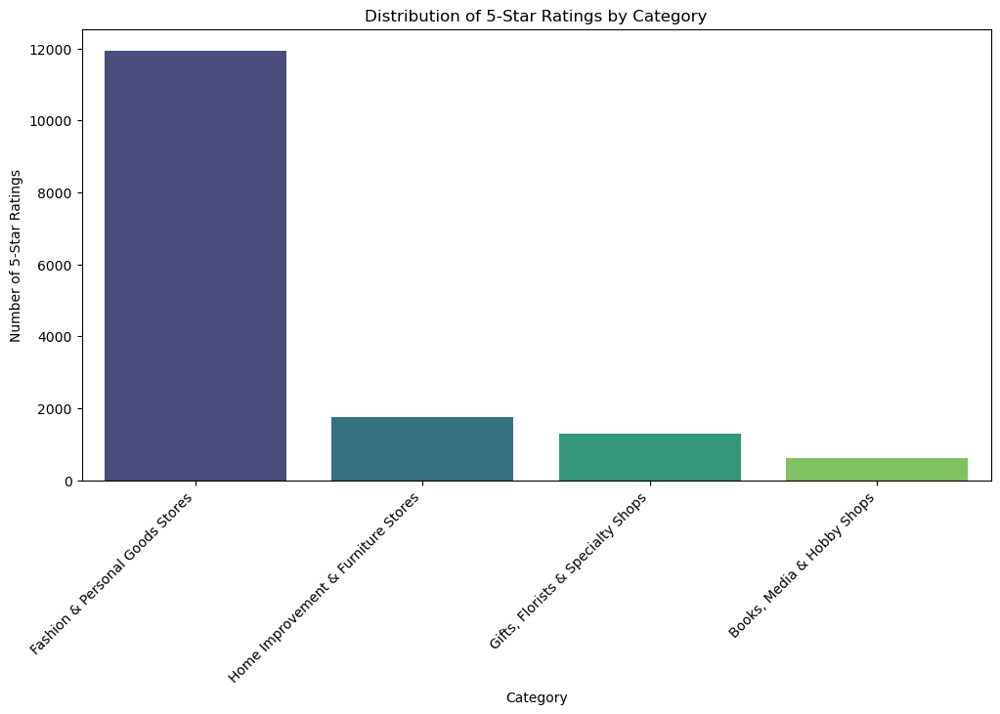

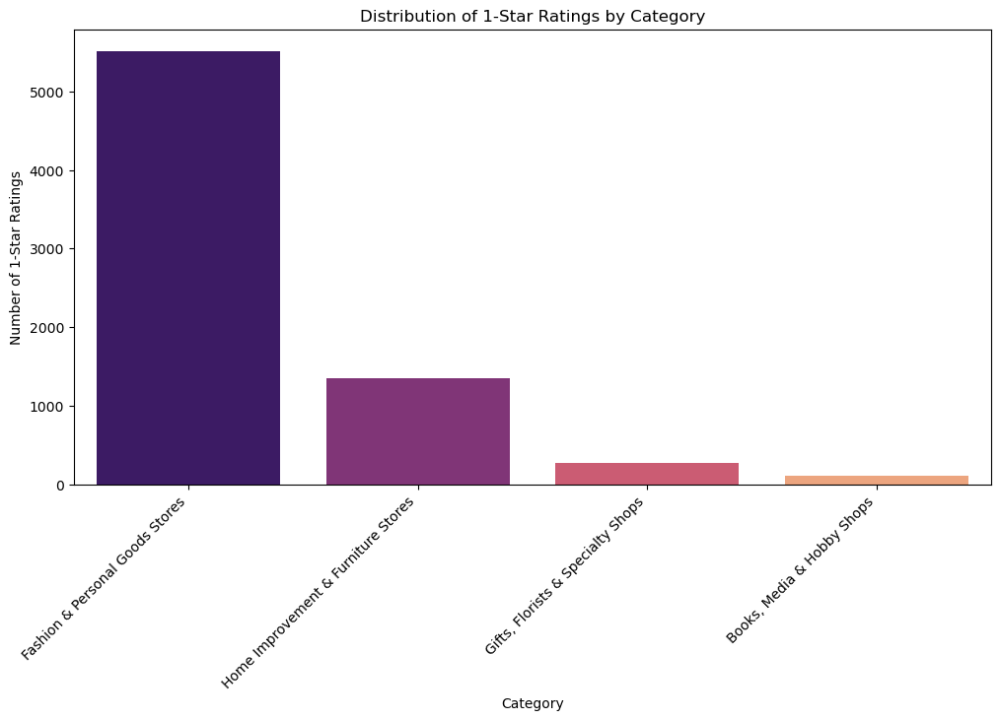

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by cluster_label and count the number of 5-star reviews
five_star_counts = review_df3[review_df3['stars'] == 5].groupby('cluster_label')['stars'].count().sort_values(ascending=False)

# Group by cluster_label and count the number of 1-star reviews (negative reviews)
one_star_counts = review_df3[review_df3['stars'] == 1].groupby('cluster_label')['stars'].count().sort_values(ascending=False)

# Plot 5-star ratings distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=five_star_counts.index, y=five_star_counts.values, palette="viridis")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Category")
plt.ylabel("Number of 5-Star Ratings")
plt.title("Distribution of 5-Star Ratings by Category")
plt.show()

# Plot 1-star ratings distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=one_star_counts.index, y=one_star_counts.values, palette="magma")
plt.xticks(rotation=45, ha='right')
plt.xlabel("Category")
plt.ylabel("Number of 1-Star Ratings")
plt.title("Distribution of 1-Star Ratings by Category")
plt.show()

The reason why Fashion & Personal Goods Stores have the highest number of both 5-star and 1-star reviews is that they have the highest total number of reviews.

In [35]:
pip install wordcloud

  Using cached wordcloud-1.9.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.4 kB)
Using cached wordcloud-1.9.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (547 kB)
Note: you may need to restart the kernel to use updated packages.


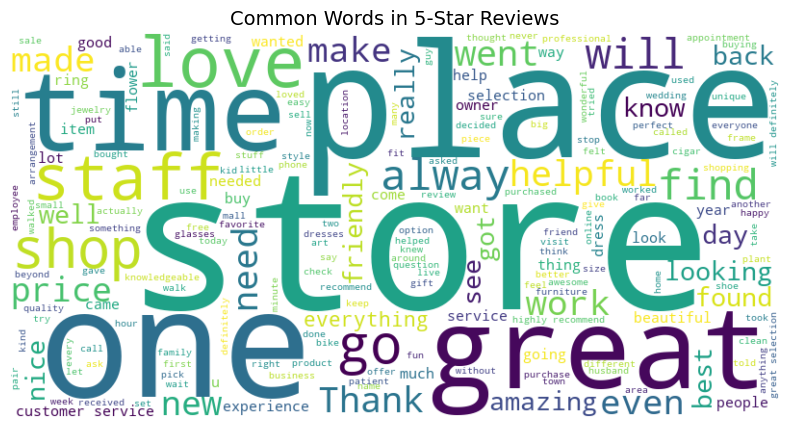

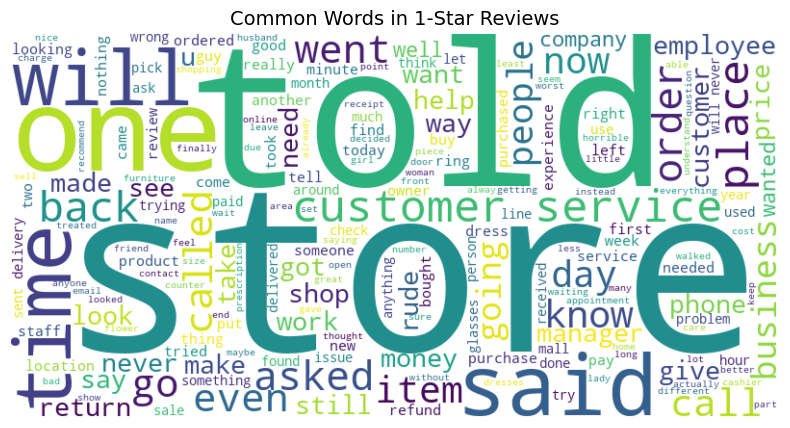

In [36]:
from wordcloud import WordCloud

# Function to generate word clouds
def generate_wordcloud(text_data, title):
    wordcloud = WordCloud(width=800, height=400, background_color="white", colormap="viridis").generate(" ".join(text_data))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=14)
    plt.show()

# Extract text data for 5-star and 1-star reviews
five_star_reviews = review_df3[review_df3['stars'] == 5]['text']
one_star_reviews = review_df3[review_df3['stars'] == 1]['text']

# Generate word clouds for customer insights
generate_wordcloud(five_star_reviews, "Common Words in 5-Star Reviews")
generate_wordcloud(one_star_reviews, "Common Words in 1-Star Reviews")

1-star reviews focus on poor service, long wait times, and issues with orders or refunds.
5-star reviews highlight great customer service, helpful staff, and enjoyable shopping experiences.

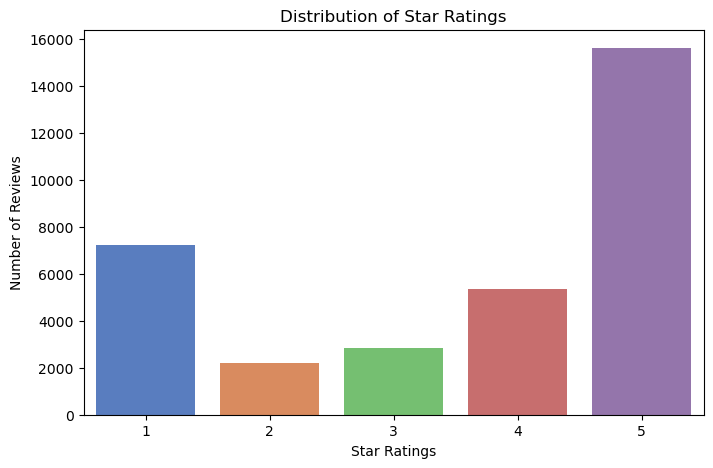

In [10]:
#Code for Star Rating Distribution Chart
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Count the number of reviews per star rating
star_counts = review_df3['stars'].value_counts().sort_index()

# Plot the Star Rating Distribution
plt.figure(figsize=(8, 5))
sns.barplot(x=star_counts.index, y=star_counts.values, palette="muted")
plt.xlabel("Star Ratings")
plt.ylabel("Number of Reviews")
plt.title("Distribution of Star Ratings")
plt.show()

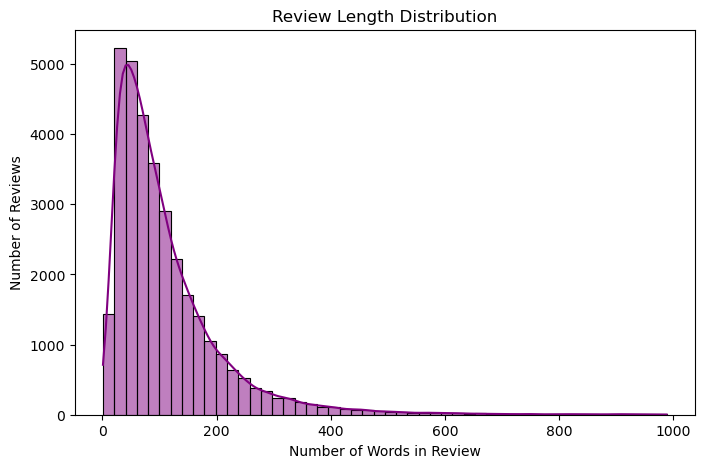

In [13]:
#Code for Review Length Distribution Chart

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate review length
review_df3['review_length'] = review_df3['text'].apply(lambda x: len(x.split()))

# Plot the Review Length Distribution
plt.figure(figsize=(8, 5))
sns.histplot(review_df3['review_length'], bins=50, kde=True, color="purple")
plt.xlabel("Number of Words in Review")
plt.ylabel("Number of Reviews")
plt.title("Review Length Distribution")
plt.show()

Sentiment Analysis

In [15]:
pip install textblob


  Using cached textblob-0.19.0-py3-none-any.whl.metadata (4.4 kB)
Using cached textblob-0.19.0-py3-none-any.whl (624 kB)
Note: you may need to restart the kernel to use updated packages.


In [54]:
from nltk.sentiment import SentimentIntensityAnalyzer
# Download necessary resources
nltk.download("vader_lexicon")

# Initialize VADER
sia = SentimentIntensityAnalyzer()

# Function to apply sentiment analysis based on text length
def get_sentiment(text):
    if isinstance(text, str):
        word_count = len(text.split())  # Count words
        if word_count <= 30:  # Short review: Use VADER
            return sia.polarity_scores(text)["compound"]
        else:  # Long review: Use TextBlob
            return TextBlob(text).sentiment.polarity
    return 0  # Default neutral score if text is missing

# Apply the sentiment function
review_df3["sentiment"] = review_df3["cleaned_text"].apply(get_sentiment)

# Compute average sentiment per category
sentiment_by_category = review_df3.groupby("cluster_label")["sentiment"].mean()

# Display sentiment scores per category
print("\n📊 Average sentiment score per category (Hybrid VADER + TextBlob):")
print(sentiment_by_category)

[nltk_data] Downloading package vader_lexicon to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!



📊 Average sentiment score per category (Hybrid VADER + TextBlob):
cluster_label
Books, Media & Hobby Shops             0.365689
Fashion & Personal Goods Stores        0.312594
Gifts, Florists & Specialty Shops      0.452044
Home Improvement & Furniture Stores    0.251344
Name: sentiment, dtype: float64


[nltk_data] Downloading package vader_lexicon to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


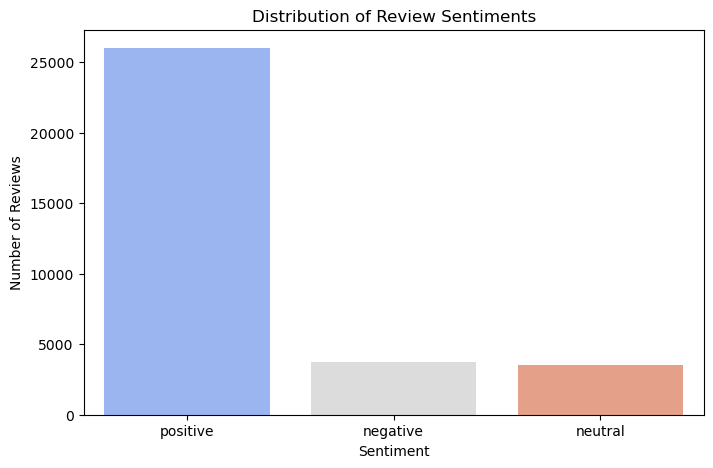

In [16]:
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
import matplotlib.pyplot as plt
import seaborn as sns


# Function to apply sentiment analysis based on text length
def get_sentiment(text):
    if isinstance(text, str):
        word_count = len(text.split())  # Count words
        if word_count <= 30:  # Short review: Use VADER
            return sia.polarity_scores(text)["compound"]
        else:  # Long review: Use TextBlob
            return TextBlob(text).sentiment.polarity
    return 0  # Default neutral score if text is missing

# Apply the sentiment function
review_df3["sentiment_score"] = review_df3["text"].apply(get_sentiment)

# Classify reviews as positive, neutral, or negative based on sentiment score
review_df3["sentiment_label"] = review_df3["sentiment_score"].apply(
    lambda x: "positive" if x > 0.05 else ("negative" if x < -0.05 else "neutral")
)

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(max_features=500, stop_words="english")
tfidf_matrix = tfidf_vectorizer.fit_transform(review_df3["text"])

# Display sentiment distribution
sentiment_counts = review_df3["sentiment_label"].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette="coolwarm")
plt.xlabel("Sentiment")
plt.ylabel("Number of Reviews")
plt.title("Distribution of Review Sentiments")
plt.show()


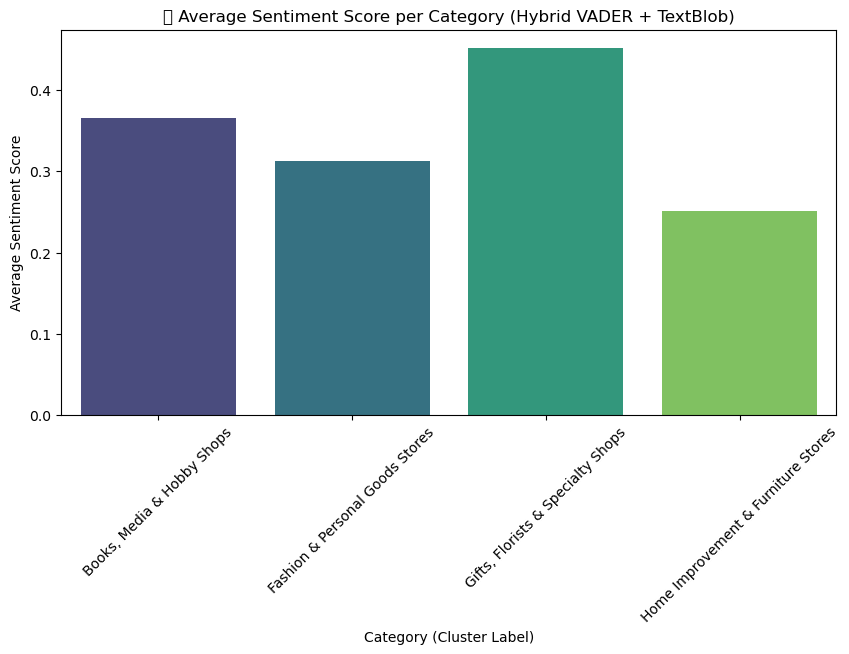

In [55]:
# Set the figure size
plt.figure(figsize=(10, 5))

# Create a bar plot
sns.barplot(x=sentiment_by_category.index, y=sentiment_by_category.values, palette="viridis")

# Add labels and title
plt.xlabel("Category (Cluster Label)")
plt.ylabel("Average Sentiment Score")
plt.title("📊 Average Sentiment Score per Category (Hybrid VADER + TextBlob)")

# Show the plot
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.show()


Key Observations:
1. Gifts, Florists & Specialty Shops has the highest sentiment score, suggesting that customers generally express the most positive sentiment when reviewing stores in this category.
2. Home Improvement & Furniture Stores has the lowest sentiment score, which may indicate that customers tend to have more neutral or slightly negative experiences in this category.

In [ ]:
🔹NLP

In [59]:
!pip install vaderSentiment


  Using cached vaderSentiment-3.3.2-py2.py3-none-any.whl.metadata (572 bytes)
Using cached vaderSentiment-3.3.2-py2.py3-none-any.whl (125 kB)


In [61]:
!pip install bertopic umap-learn hdbscan sentence-transformers


  Using cached bertopic-0.16.4-py3-none-any.whl.metadata (23 kB)
  Using cached umap_learn-0.5.7-py3-none-any.whl.metadata (21 kB)
  Using cached hdbscan-0.8.40-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (15 kB)
  Using cached sentence_transformers-3.4.1-py3-none-any.whl.metadata (10 kB)
  Using cached pynndescent-0.5.13-py3-none-any.whl.metadata (6.8 kB)
Using cached bertopic-0.16.4-py3-none-any.whl (143 kB)
Using cached umap_learn-0.5.7-py3-none-any.whl (88 kB)
Using cached hdbscan-0.8.40-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (4.6 MB)
Using cached sentence_transformers-3.4.1-py3-none-any.whl (275 kB)
Using cached pynndescent-0.5.13-py3-none-any.whl (56 kB)


The wordcloud helps businesses understand customer focus areas.

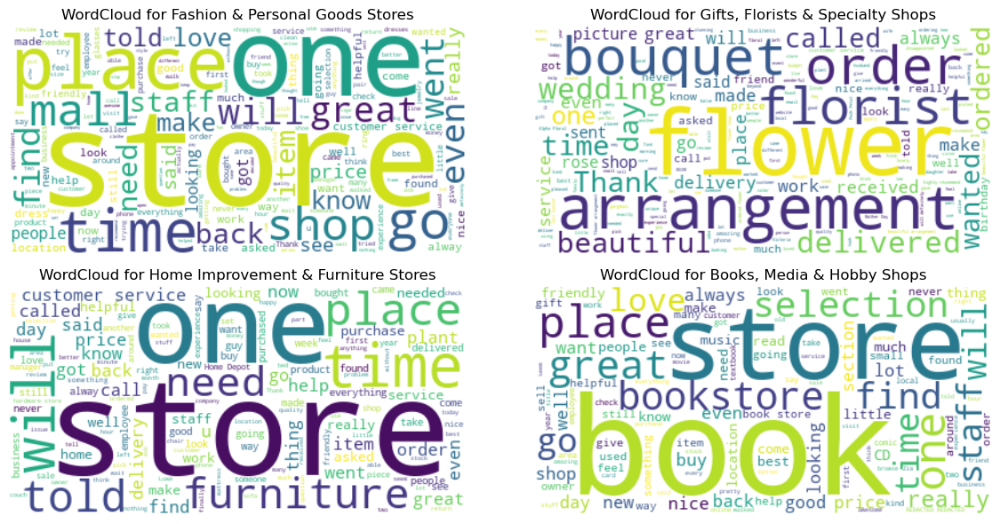

In [63]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Set figure size
plt.figure(figsize=(12, 6))

# Generate WordCloud for each shopping category
for i, category in enumerate(review_df["cluster_label"].unique()):
    words = " ".join(review_df[review_df["cluster_label"] == category]["cleaned_text"].dropna())
    wordcloud = WordCloud(width=400, height=200, background_color="white").generate(words)
    
    plt.subplot(2, 2, i+1)  # Adjust layout for multiple subplots
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"WordCloud for {category}")

# Improve layout and display
plt.tight_layout()
plt.show()


Key Insights from the WordClouds:
Fashion & Personal Goods Stores
Customers frequently talk about the store location (mall, place), shopping experience (find, shop), and customer service (staff, love, great).

Gifts, Florists & Specialty Shops
This category has words related to flowers and gifts, with a strong focus on ordering, delivery, and special occasions (wedding, birthday).

Home Improvement & Furniture Stores
Discussions here are more practical, focusing on product needs (furniture, price, need) and customer service issues (called, told, help).

Books, Media & Hobby Shops
Customers frequently talk about book selection, shopping experience, and staff interactions.

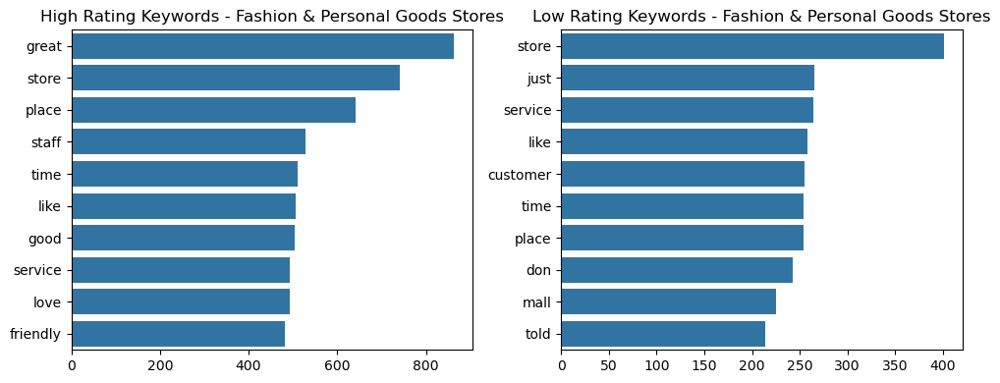

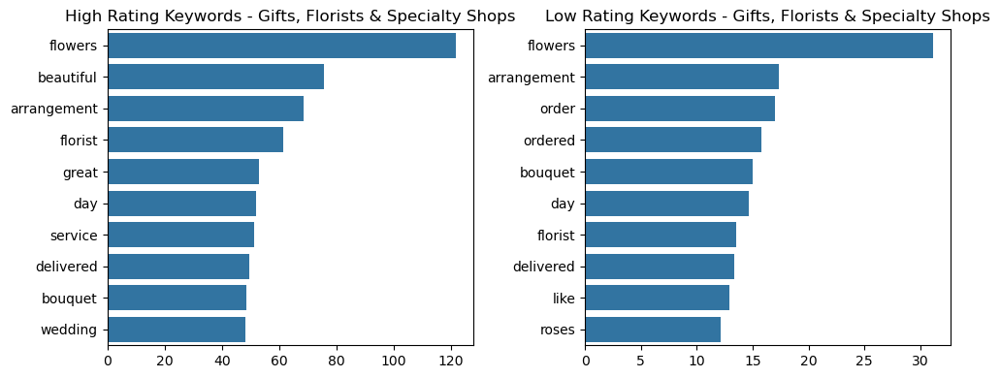

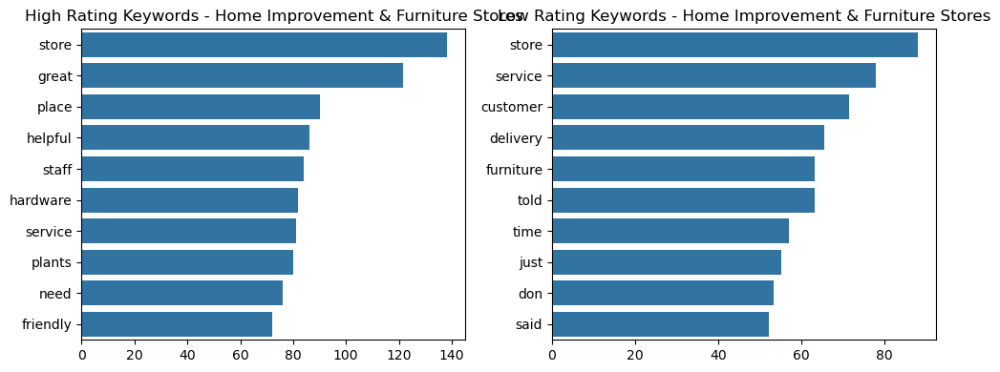

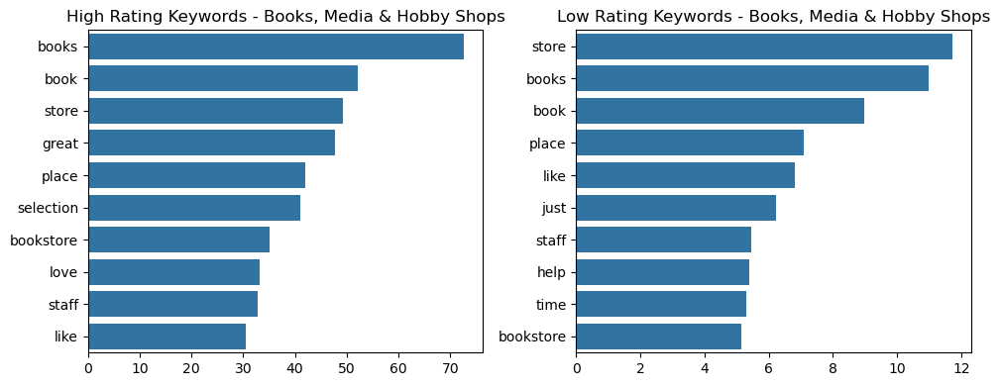

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.manifold import TSNE
from sentence_transformers import SentenceTransformer

# 📌 Step 1️⃣: Load Data
review_df = pd.read_csv("categorized_shopping_reviews.csv", encoding="ISO-8859-1")

# Ensure necessary columns exist
if "cleaned_text" not in review_df.columns:
    review_df["cleaned_text"] = review_df["text"]

if "stars" not in review_df.columns:
    raise KeyError("Column 'stars' is missing. Please check the CSV file.")

# Retain only useful columns and remove missing values
review_df = review_df[["cluster_label", "stars", "cleaned_text"]].dropna()

# 📌 Step 2️⃣: Split Data into High and Low Ratings
high_ratings = review_df[review_df["stars"] >= 4]  # High ratings (4-5 stars)
low_ratings = review_df[review_df["stars"] <= 2]   # Low ratings (1-2 stars)

# 📌 Step 3️⃣: TF-IDF Analysis for High vs. Low Rating Keywords
tfidf_vectorizer = TfidfVectorizer(stop_words="english", max_features=500)

def get_top_keywords(data):
    tfidf_matrix = tfidf_vectorizer.fit_transform(data["cleaned_text"])
    feature_names = tfidf_vectorizer.get_feature_names_out()
    word_counts = np.asarray(tfidf_matrix.sum(axis=0)).flatten()
    keywords = sorted(zip(feature_names, word_counts), key=lambda x: x[1], reverse=True)[:10]
    return keywords

# Generate bar plots for high/low rating keywords per category
for category in review_df["cluster_label"].unique():
    high_words = get_top_keywords(high_ratings[high_ratings["cluster_label"] == category])
    low_words = get_top_keywords(low_ratings[low_ratings["cluster_label"] == category])

    plt.figure(figsize=(10, 4))
    
    words, counts = zip(*high_words)
    plt.subplot(1, 2, 1)
    sns.barplot(x=list(counts), y=list(words))
    plt.title(f"High Rating Keywords - {category}")

    words, counts = zip(*low_words)
    plt.subplot(1, 2, 2)
    sns.barplot(x=list(counts), y=list(words))
    plt.title(f"Low Rating Keywords - {category}")

    plt.tight_layout()
    plt.show()

# 📌 Step 4️⃣: BERT Word Embeddings Visualization
model = SentenceTransformer('all-MiniLM-L6-v2')

# Sample a portion of the data for faster computation
subset_high = high_ratings["cleaned_text"].dropna().sample(500, random_state=42).tolist()
subset_low = low_ratings["cleaned_text"].dropna().sample(500, random_state=42).tolist()

embeddings_high = model.encode(subset_high)
embeddings_low = model.encode(subset_low)

# Apply t-SNE for dimensional


📌 Fashion & Personal Goods Stores
High Ratings: Customers appreciate friendly staff, great service, and good store experience.
Low Ratings: Complaints about poor service, waiting time, and unclear communication.
Insight: Service quality is the key factor in ratings.

📌 Gifts, Florists & Specialty Shops
High Ratings: Customers love beautiful flower arrangements, bouquets, and delivery service.
Low Ratings: Complaints about order issues, late delivery, and product quality.
Insight: Delivery reliability is crucial for customer satisfaction.
    
📌 Home Improvement & Furniture Stores
High Ratings: Customers value helpful staff, wide product selection (hardware, plants), and service.
Low Ratings: Issues with delivery, furniture quality, and miscommunication.
Insight: Improving delivery service can boost ratings.

📌 Books, Media & Hobby Shops
High Ratings: Customers enjoy book selection, bookstore atmosphere, and helpful staff.
Low Ratings: Complaints about slow service and unhelpful staff.
Insight: Better customer assistance can enhance experience.

Topic Word Scores

In [74]:
!pip install bertopic umap-learn hdbscan

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [75]:
from bertopic import BERTopic

# Retrain the BERTopic model
topic_model = BERTopic()
topics, probs = topic_model.fit_transform(review_df["cleaned_text"].dropna().tolist())

# Ensure variables are defined
print("BERTopic model has been created!")


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

BERTopic model has been created!


In [ ]:
from bertopic import BERTopic
import matplotlib.pyplot as plt

# Get top words for each topic
topic_info = topic_model.get_topic_info()
print(topic_info.head())

# Visualize the most relevant words for each topic
topic_model.visualize_barchart(top_n_topics=10)

   Topic  Count                                   Name  \
0     -1  11292                       -1_the_to_and_of   
1      0   1360         0_dress_dresses_bridal_wedding   
2      1   1014         1_staff_helpful_friendly_great   
3      2    949  2_flowers_florist_arrangement_bouquet   
4      3    909           3_cigar_cigars_smoke_tobacco   

                                      Representation  \
0    [the, to, and, of, in, for, it, that, is, this]   
1  [dress, dresses, bridal, wedding, she, appoint...   
2  [staff, helpful, friendly, great, very, knowle...   
3  [flowers, florist, arrangement, bouquet, flowe...   
4  [cigar, cigars, smoke, tobacco, humidor, loung...   

                                 Representative_Docs  
0  [I love this location!  Staff is extremely fri...  
1  [By far the worst experience I've had in a bri...  
2  [Great selection. Super high quality. The staf...  
3  [Today I received a beautiful bouquet of flowe...  
4  [It's a small cigar shop in a strip 

📌 Topic 0 - Wedding Dresses & Bridal Wear
🔑 Top words: "dress", "dresses", "bridal", "wedding", "she"
Interpretation: This topic is related to wedding dresses and bridal fashion.
Business Insight: Likely associated with fashion stores specializing in wedding attire.
    
📌 Topic 1 - Customer Service & Staff Interactions
🔑 Top words: "staff", "helpful", "friendly", "great", "very"
Interpretation: This topic relates to customer service experiences.
Business Insight: Good service seems to be a key theme; stores should focus on maintaining a helpful and friendly staff.

📌 Topic 2 - Flowers & Floral Arrangements
🔑 Top words: "flowers", "florist", "arrangement", "bouquet", "flower"
Interpretation: Related to florists and flower delivery services.
Business Insight: This topic suggests discussions about flower arrangements, bouquets, and quality of service in floral shops.
    
📌 Topic 3 - Tobacco & Cigar Products
🔑 Top words: "cigar", "cigars", "smoke", "tobacco", "humidor"
Interpretation: Focuses on tobacco products and cigar stores.
Business Insight: Retailers in this category should consider customer concerns about cigar quality, smoke experience, and storage (humidor usage).
    
📌 Topic 4 - Pharmacies & Prescription Medications
🔑 Top words: "pharmacy", "cvs", "pharmacist", "prescriptions", "prescription"
Interpretation: Related to pharmacy services and medications.
Business Insight: Likely reflects customer experiences in pharmacies, potentially about prescription fulfillment, customer service, or medication availability.
    
📌 Topic 5 - Gardening & Plants
🔑 Top words: "plants", "plant", "garden", "nursery", "pots"
Interpretation: This topic relates to gardening and plant stores.
Business Insight: Stores selling plants, gardening supplies, and plant nurseries can use this insight to target their marketing toward gardening enthusiasts.
    
📌 Topic 6 - Shoes & Footwear
🔑 Top words: "shoes", "shoe", "pair", "running", "feet"
Interpretation: Focuses on footwear, running shoes, and shoe stores.
Business Insight: Likely represents customer feedback on shoe comfort, performance, or style preferences.
    
📌 Topic 7 - Furniture & Home Delivery
🔑 Top words: "couch", "furniture", "delivery", "we", "call"
Interpretation: Discusses home furniture and delivery services.
Business Insight: This suggests customers frequently talk about delivery experiences when purchasing furniture. Retailers should focus on fast & reliable delivery.
    
📌 Topic 8 - Clothing & Fashion
🔑 Top words: "clothes", "clothing", "boutique", "cute", "accessories"
Interpretation: Related to fashion and clothing stores.
Business Insight: Customers likely discuss trendy clothing items, boutique experiences, and accessories.
    
📌 Topic 9 - Toys & Kids’ Products
🔑 Top words: "toys", "toy", "kids", "lego", "mass"
Interpretation: Covers children’s toys, games, and products for kids.
Business Insight: Likely discussions about popular toys (e.g., LEGO), children’s stores, and toy shopping experiences.


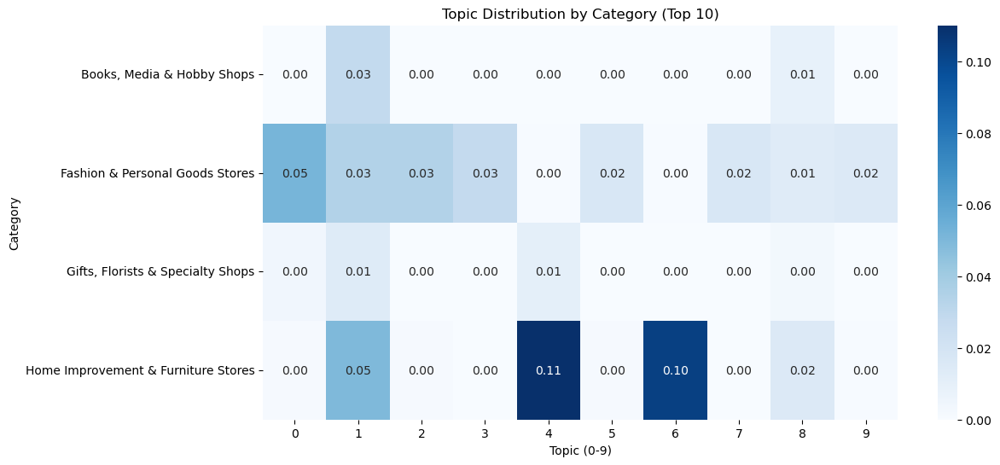

In [81]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 📌 Step 1️⃣: Ensure Topics Exist in DataFrame
if "topic" not in review_df.columns:
    raise KeyError("Column 'topic' is missing. Ensure BERTopic was applied.")

# 📌 Step 2️⃣: Compute Topic Distribution Per Category
# Count occurrences of each topic within each category
topic_distribution = review_df.groupby(["cluster_label", "topic"]).size().unstack(fill_value=0)

# Normalize topic distribution row-wise (to get percentages instead of raw counts)
topic_distribution = topic_distribution.div(topic_distribution.sum(axis=1), axis=0)

# 📌 Step 3️⃣: Filter Only Topics 0-9 (Ensure Consistency)
filtered_topics = topic_distribution.loc[:, (topic_distribution.columns >= 0) & (topic_distribution.columns <= 9)]

# 📌 Step 4️⃣: Plot Heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(filtered_topics, annot=True, cmap="Blues", fmt=".2f")
plt.title("Topic Distribution by Category (Top 10)")
plt.xlabel("Topic (0-9)")
plt.ylabel("Category")
plt.show()



🚀 Insights & Business Takeaways
✅ Topic 1 (Customer Service) appears in all four categories, meaning customer service is a key discussion point in reviews across all store types.

✅ Fashion stores have the most diverse topic distribution, indicating that discussions about clothing, shopping experience, and product variety are common.

✅ Home Improvement & Furniture Stores have the strongest presence of Topics 6 & 7, suggesting that furniture shopping, product quality, and delivery experiences dominate customer feedback.

✅ Gifts & Florists have lower topic representation, which might indicate that discussions about this category are more concentrated on specific topics like flower arrangements rather than general shopping experiences.

Final Concludsion:

1. Customer Service is a Critical Factor Across Stores

2. Delivery & Logistics Issues in Furniture Stores
Topic 7 ("couch," "furniture," "delivery") is strongly associated with Home Improvement & Furniture Stores.
This matches our earlier observation that delivery problems contribute to negative reviews in furniture stores.
    
3. Fashion Stores Are Highly Associated with Clothing & Shopping Experience
This suggests that fashion-related terms dominate customer discussions, supporting the idea that product variety and style trends are important.
Recommendation: Ensure up-to-date fashion collections and maintain consistent product quality to meet customer expectations.

4.  Florists & Gift Shops Focus on Product Presentation
Topic 2 ("flowers," "florist," "arrangement") aligns with Gifts, Florists & Specialty Shops, showing that floral arrangements and presentation are key drivers of customer sentiment.
Recommendation: Ensure product images accurately reflect the actual arrangements and improve packaging & delivery quality.

5.  Bookstores Have Minimal Distinct Topics
The Books, Media & Hobby Shops category lacks strong topic associations, except for a small presence in Topic 1 (customer service).
This suggests that bookstore reviews may be more general and less issue-specific compared to other store types.
    
6.  Unexpected Pharmacy Mentions in Home Improvement Stores
Topic 4 ("pharmacy," "prescriptions") is strongly present in Home Improvement & Furniture Stores.
This might be due to:
   Certain home improvement stores selling medical or wellness-related products.
   Customer discussions mentioning prescription-related frustrations.
Recommendation: Investigate why pharmacy-related terms appear and ensure clear product categorization.


Recommendation for Improvemnt: 
1.  Improve Customer Service Across All Categories
Continue training staff to be more helpful and responsive.
Prioritize in-store and online customer support.

2.  Enhance Delivery & Order Fulfillment (Especially for Furniture & Florists)
Address delivery delays and product discrepancies.
Implement better tracking and communication for customers.

3.  Ensure Product Consistency & Expectations Management
In fashion stores, maintain quality control to avoid mismatched expectations.
In gift & florists, showcase real customer images to prevent dissatisfaction.

4.  Investigate Unexpected Pharmacy Mentions in Home Improvement Stores
Determine if it’s related to actual product offerings or unrelated discussions in reviews.
